<a href="https://colab.research.google.com/github/18521157/CS114.K21/blob/master/choma_key.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import pandas as pd

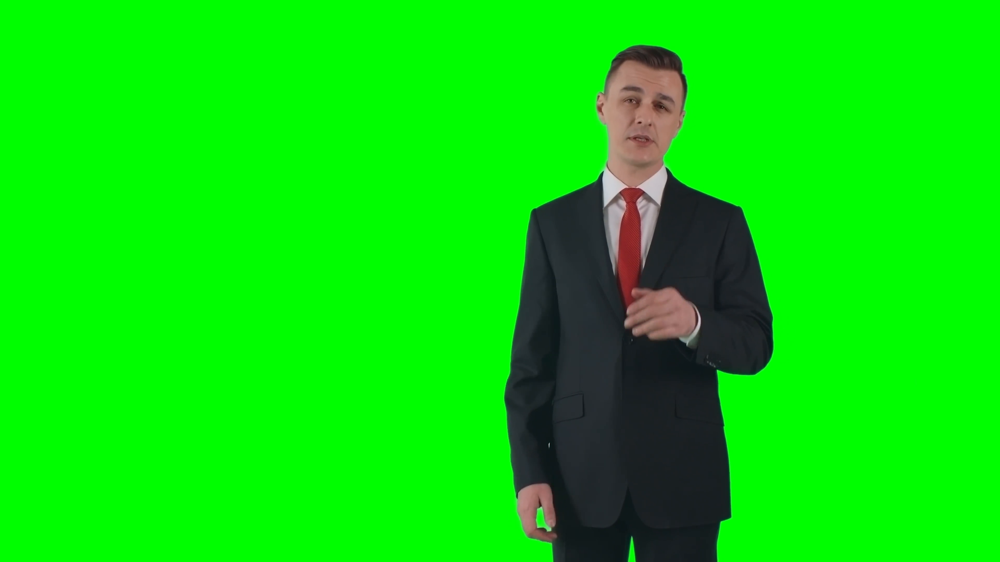

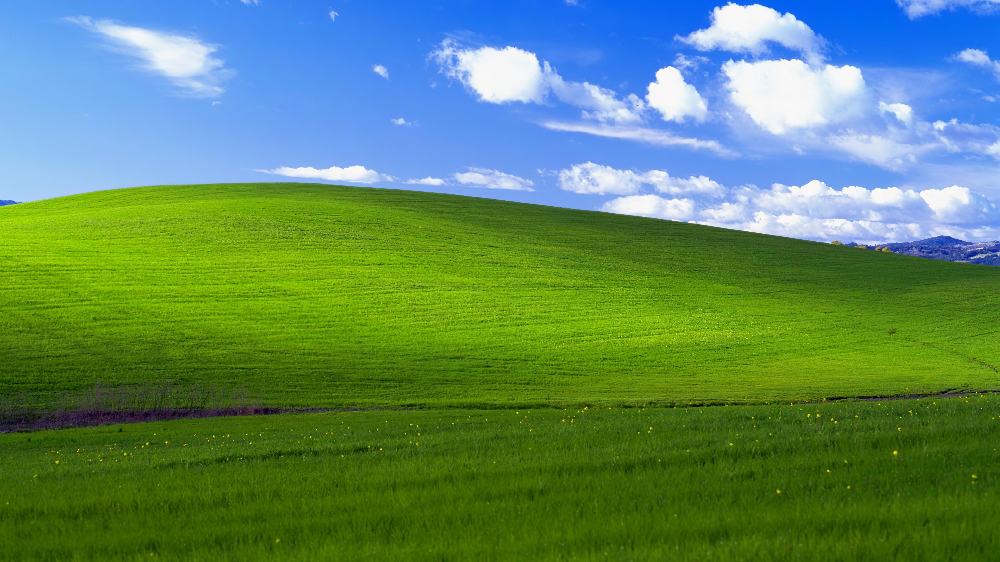

In [ ]:
image=cv2.imread("mau.png")
bg_image=cv2.imread("bg2.jpg")
cv2_imshow(image)
cv2_imshow(bg_image)

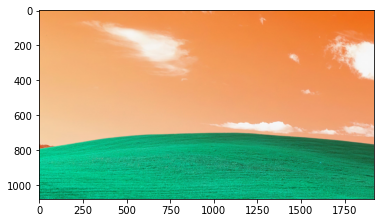

(1080, 1920, 3)
(1080, 1920, 3)


In [ ]:
bg_cropped = bg_image[:len(image), :len(image[0]), :]
plt.imshow(bg_cropped)
plt.show()
print(bg_cropped.shape)
print(image.shape)

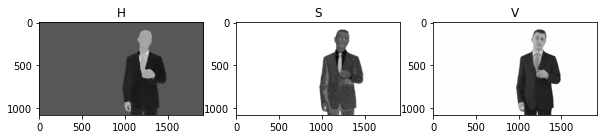

In [ ]:
image_hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
h = image_hsv[:, :, 0]
s = image_hsv[:, :, 1]
v = image_hsv[:, :, 2]

f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(10,5))
ax1.set_title("H")
ax1.imshow(h, cmap="gray")
ax2.set_title("S")
ax2.imshow(s, cmap="gray")
ax3.set_title("V")
ax3.imshow(v, cmap="gray")
plt.show()

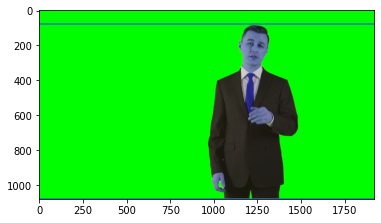

In [ ]:
top_crop_y = 75
bottom_crop_y =1079

plt.imshow(image)
plt.axhline(y=top_crop_y)
plt.axhline(y=bottom_crop_y)
plt.show()

In [ ]:
def restrict(color_component):
    return np.clip(color_component, 0, 255)
image_flattened = []

for index in range(3):
    image_top = np.array(image_hsv[:top_crop_y, :, index]).flatten()
    image_bottom = np.array(image_hsv[bottom_crop_y:, :, index]).flatten()
    top_and_bottom = np.append(image_top, image_bottom)
    top_and_bottom_series = pd.Series(top_and_bottom)
    print(top_and_bottom_series.describe())
    image_flattened.append(top_and_bottom_series)
low = []
high = []

z_value = 5.5

for i in range(3):
    mu = image_flattened[i].values.mean()
    sigma = image_flattened[i].values.std()
    deviation = z_value*sigma
    low.append(restrict(mu-deviation))
    high.append(restrict(mu+deviation))

print(low)
print(high)

count    145920.000000
mean         59.928666
std           1.602546
min          18.000000
25%          60.000000
50%          60.000000
75%          60.000000
max          60.000000
dtype: float64
count    145920.000000
mean        254.661328
std           7.534833
min          54.000000
25%         255.000000
50%         255.000000
75%         255.000000
max         255.000000
dtype: float64
count    145920.000000
mean        253.545977
std           9.965125
min          24.000000
25%         254.000000
50%         254.000000
75%         254.000000
max         254.000000
dtype: float64
[51.114692755133, 213.219890057822, 198.73797648200602]
[68.74264002995471, 255.0, 255.0]


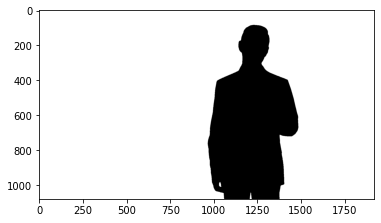

In [ ]:
mask_lower = np.array([low[0], low[1], low[2]])
mask_higher = np.array([high[0], high[1], high[2]])

image_mask = cv2.inRange(image_hsv, mask_lower, mask_higher)
plt.imshow(image_mask, cmap="gray")
plt.show()

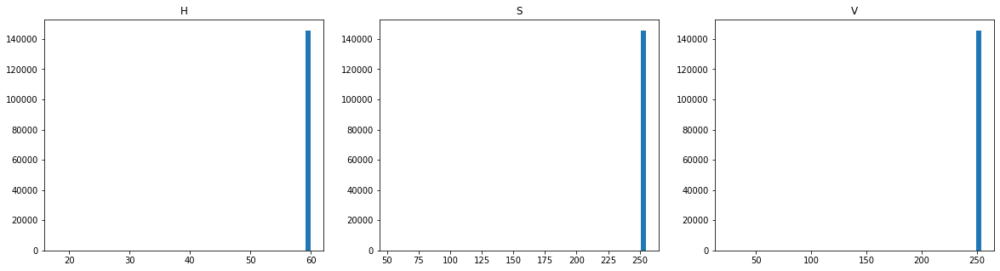

In [ ]:
f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,5))
ax1.set_title("H")
ax1.hist(image_flattened[0], bins=50)
ax2.set_title("S")
ax2.hist(image_flattened[1], bins=50)
ax3.set_title("V")
ax3.hist(image_flattened[2], bins=50)
plt.show()

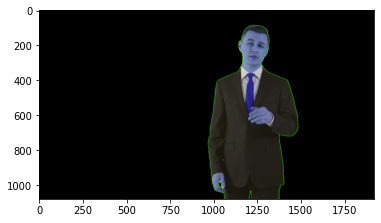

In [ ]:
masked_image = np.copy(image) 
masked_image[image_mask != 0] = [0, 0, 0]
plt.imshow(masked_image)
plt.show()

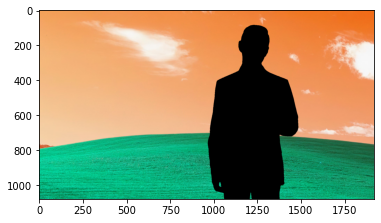

In [ ]:
bg_masked = np.copy(bg_cropped)
bg_masked[image_mask == 0] = [0,0,0]

plt.imshow(bg_masked)
plt.show()

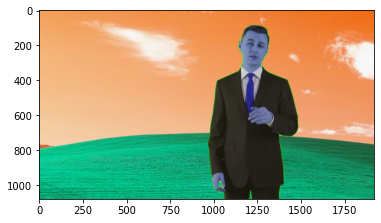

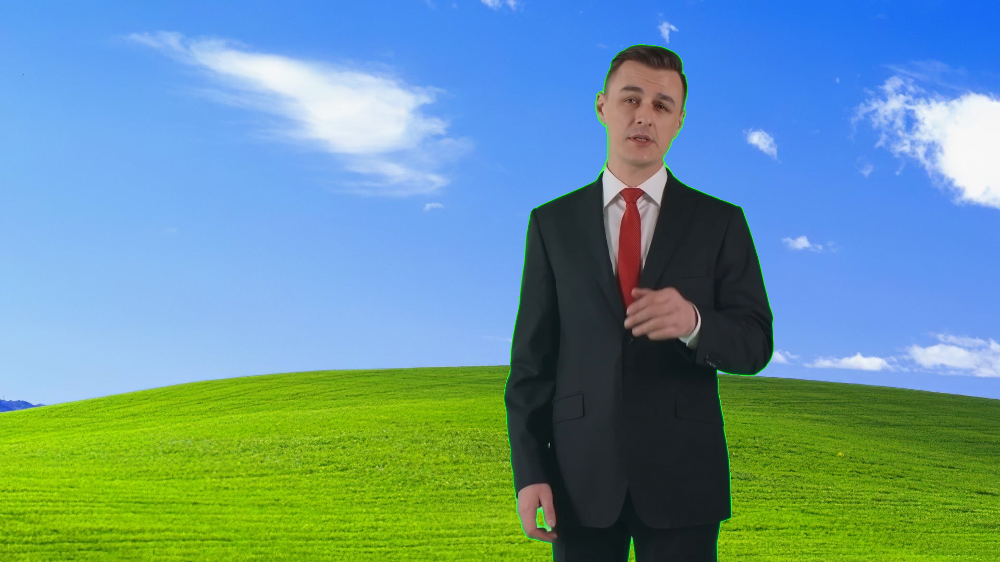

In [ ]:
output = bg_masked + masked_image
plt.imshow(output)
plt.show()
cv2_imshow(output) 